**Advanced Lane Detection Project**

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


In [288]:
import cv2
from functools import partial
import glob
from io import BytesIO
from IPython.display import Image
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import matplotlib as mpl
import matplotlib.image as mpimg
import matplotlib.patches as patches
import matplotlib.pyplot as plt
%matplotlib inline
from moviepy.editor import VideoFileClip
from multiprocessing import Pool
import numpy as np
from skimage import img_as_ubyte
from tqdm import tqdm

**Helper Functions**

Used to display interactive images, and side-by-side images for analysis

In [289]:
# Helper functions for displaying images within the notebook

def show_interactive(img):
    '''Display an image with interactive controls for tuning threshold parameters. 
    
    More info here:
    https://ipython.org/ipython-doc/3/api/generated/IPython.display.html#IPython.display.Image
    '''
    
    if img.ndim == 2:
        format, cmap = 'png', mpl.cm.gray
    elif img.ndim == 3:
        format, cmap = 'jpg', None
    else:
        raise ValueError("Only 2- or 3-d arrays can be displayed as images.")
        
    with BytesIO() as buffer:
        mpl.image.imsave(buffer, img, format=format, cmap=cmap, vmin=0, vmax=1.0)
        out = buffer.getvalue()
        
    return Image(out, width=600)


def show_RGB(img1, img2, title1='Undistorted', title2='Binary', chan1='BGR', chan2='GRAY'):
    '''Displays two images side-by-side using Matplotlib'''
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.set_axis_off(), ax2.set_axis_off()
    
    if chan1 == 'BGR':
        img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
    if chan2 == 'BGR':
        img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)    
        
    ax1.imshow(img1, cmap='gray')
    ax1.set_title(title1, fontsize=20)
    ax2.imshow(img2, cmap='gray')
    ax2.set_title(title2, fontsize=20)

## 1. Camera Calibration
**Firstly, lets compute the camera calibration using chessboard images**

Refer Lesson 7: Camera Calibration

In [290]:
# Code to calibrate, and obtain object and image points
objp = np.zeros((9*6, 3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.
#output_path = ./output_images/

# List of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Locate the chessboard corners
for fname in tqdm(images):
    # Get image array and convert to grayscale
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)

    # If found, add object points, image points
    if ret:
        objpoints.append(objp)
        imgpoints.append(corners)
        
        # Save in output path
        # img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        # cv2.imwrite(output_path + fname.split('/')[-1].split('.')[0] + '.jpg', img)

print('Calibration complete.')

100%|██████████| 20/20 [00:03<00:00,  5.75it/s]

Calibration complete.


## 2. Distortion Correction
**Perform image undistortion from object points and image points obtained from test images** 

In [291]:
ret, mtx, dist, rvecs, tvecs = None, None, None, None, None
# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')
output_path = './output_images/'
for fname in images:
    img = cv2.imread(fname)
    
    # Camera calibration 
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)

    # Undistorted version
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    cv2.imwrite(output_path + 'undistorted/' + fname.split('/')[-1].split('.')[0] + '_undistort.jpg', undist)

In [292]:
images = glob.glob('./test_images/*.jpg')
for fname in images: 
    img = cv2.imread(fname)
    
    # Camera calibration
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)

    # Undistorted version
    undist = cv2.undistort(img, mtx, dist, None, mtx)#print(fname)
    cv2.imwrite(output_path + 'undistorted/' + fname.split('/')[-1].split('.')[0] + '_undistort.jpg', undist)

In [293]:
# Undistortion function
def undistort(img):
    return cv2.undistort(img, mtx, dist, None, mtx)

**Loading Undistorted Test Images**

In [294]:
test1 = cv2.imread('./output_images/undistorted/test1_undistort.jpg')  # challenging - light pavement
test2 = cv2.imread('./output_images/undistorted/test2_undistort.jpg')  # optimal conditions
test3 = cv2.imread('./output_images/undistorted/test3_undistort.jpg')  # optimal conditions
test4 = cv2.imread('./output_images/undistorted/test4_undistort.jpg')  # challenging - light pavement, shadows
test5 = cv2.imread('./output_images/undistorted/test5_undistort.jpg')  # challenging - light pavement, shadows
test6 = cv2.imread('./output_images/undistorted/test6_undistort.jpg')  # challenging - light pavement, shadows

straight1 = cv2.imread('./output_images/undistorted/straight_lines1_undistort.jpg')  # optimal conditions
straight2 = cv2.imread('./output_images/undistorted/straight_lines2_undistort.jpg')  # optimal conditions

## 3.1 Gradient Thresholds
* **Directional Gradients of X and Y**
* **Gradient Magnitude**
* **Gradient Direction**

Refer Lesson 8

In [295]:
## Sobel thresholding on either x or y axis 
def abs_sobel_thresh(img, orient, sobel_kernel=3, thresh = (0, 255)):
    
    # 1) Convert to grayscale
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif orient == 'y':
        sobel = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # 6) Return this mask as your binary_output image
    return grad_binary

In [296]:
## Interactive version for tuning threshold parameters (only works while running Jupyter Notebook)
# More info here -- http://ipywidgets.readthedocs.io/en/stable/examples/Using%20Interact.html

# 5, 40, 255 seem like good values
img = test2

@interact
def abs_thresh_image(image: fixed(img), orient:['x','y']='x', sobel_kernel:(3,21,2)=3, thresh_min:(0,255,1)=30, thresh_max:(0,255,1)=100):
  
    binary = abs_sobel_thresh(image, orient, sobel_kernel, (thresh_min, thresh_max))
    
    return show_interactive(binary)

interactive(children=(Dropdown(description='orient', options=('x', 'y'), value='x'), IntSlider(value=3, description='sobel_kernel', max=21, min=3, step=2), IntSlider(value=30, description='thresh_min', max=255), IntSlider(value=100, description='thresh_max', max=255), Output()), _dom_classes=('widget-interact',))

In [297]:
## Overall magnitude of gradient using both 'x' and 'y' axis
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):

    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Calculate the magnitude
    gradmag = np.sqrt(np.square(sobelx) + np.square(sobely)) 
    
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    gradmag = np.uint8(255*gradmag/np.max(gradmag))
    
    # 5) Create a binary mask where mag thresholds are met
    mag_binary = np.zeros_like(gradmag)
    mag_binary[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    
    # 6) Return this mask as your binary_output image
    return mag_binary


In [298]:
## Interactive version for tuning threshold parameters (only works while running Jupyter Notebook)
# 5, 65, 255 seem like good values
img = test2

@interact
def mag_thresh_image(image: fixed(img), sobel_kernel:(3,21,2)=3, thresh_min:(0,255)=30, thresh_max:(0,255)=100):
  
    mag_binary = mag_thresh(image, sobel_kernel, (thresh_min, thresh_max))
    
    return show_interactive(mag_binary)

interactive(children=(IntSlider(value=3, description='sobel_kernel', max=21, min=3, step=2), IntSlider(value=30, description='thresh_min', max=255), IntSlider(value=100, description='thresh_max', max=255), Output()), _dom_classes=('widget-interact',))

In [299]:
## function that applies Sobel x and y, 
## then computes the direction of the gradient
## and applies a threshold.
def dir_threshold(img, sobel_kernel=11, thresh=(0, np.pi/2)):
    
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)

    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    grad_dir = np.arctan2(abs_sobely, abs_sobelx)
    
    # 5) Create a binary mask where direction thresholds are met
    dir_binary = np.zeros_like(grad_dir)
    dir_binary[(grad_dir >= thresh[0]) & (grad_dir <= thresh[1])] = 1
    
    # 6) Return this mask as your binary_output image
    return dir_binary



In [300]:
## Interactive version for tuning threshold parameters (only works while running Jupyter Notebook)
# 3, 0.55, 0.95 seem like good values
img = test2

@interact
def dir_thresh_image(image:fixed(img), sobel_kernel:(3,21,2)=3, 
                     dir_min:(0.,np.pi/2,0.05)=0.6, dir_max:(0,np.pi/2,0.05)=1.0):
  
    dir_binary = dir_threshold(image, sobel_kernel, thresh=(dir_min, dir_max))
    
    return show_interactive(dir_binary)

interactive(children=(IntSlider(value=3, description='sobel_kernel', max=21, min=3, step=2), FloatSlider(value=0.6, description='dir_min', max=1.5707963267948966, step=0.05), FloatSlider(value=1.0, description='dir_max', max=1.5707963267948966, step=0.05), Output()), _dom_classes=('widget-interact',))

In [301]:
def combined_threshold(image, ksize=11, thresh=(0,255)):
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=thresh)
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=thresh)
    mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=thresh)
    dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0, np.pi/2))
    
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    return combined

In [302]:
## Interactive version for tuning threshold parameters (only works while running Jupyter Notebook)
# 5, 70, 255 seem like good values
img = test2

@interact
def combined_thresh_image(image:fixed(img), ksize:(3,21,2)=3, 
                     thresh_min:(0,255)=30, thresh_max:(0,255)=100):
  
    dir_binary = combined_threshold(image, ksize, thresh=(thresh_min, thresh_max))
    
    return show_interactive(dir_binary)

interactive(children=(IntSlider(value=3, description='ksize', max=21, min=3, step=2), IntSlider(value=30, description='thresh_min', max=255), IntSlider(value=100, description='thresh_max', max=255), Output()), _dom_classes=('widget-interact',))

## 3.2 Color Thresholds
* **Thresholding on RGB color space**
* **Thresholding on HLS color space**
* **Thresholding on HSV color space**

**Thresholding on RGB color spaces**

In [303]:
def rgb_thresh(img, channel='R', thresh=(200, 255)):
    
    # Split the image into its color channels
    R, G, B = img[:,:,2], img[:,:,1], img[:,:,0]
    
    # Select the channel to use
    if channel == 'R':
        channel = R
    elif channel == 'G':
        channel = G
    elif channel == 'B':
        channel = B
    else:
        raise ValueError("Channel not recognized. Only RGB channels can be displayed as binaries.")
    
    # Create binary mask using the chosen channel
    rgb_binary = np.zeros_like(channel)
    rgb_binary[(channel > thresh[0]) & (channel <= thresh[1])] = 1
    
    return rgb_binary

In [304]:
## Interactive version for tuning threshold parameters (only works while running Jupyter Notebook)

# Select test image
img = test5

@interact
def rgb_thresh_image(image: fixed(img), channel:['R','G','B']='R', thresh_min:(0,255)=225, thresh_max:(0,255)=255):
  
    rgb_binary = rgb_thresh(image, channel, thresh=(thresh_min, thresh_max))
    
    return show_interactive(rgb_binary)

interactive(children=(Dropdown(description='channel', options=('R', 'G', 'B'), value='R'), IntSlider(value=225, description='thresh_min', max=255), IntSlider(value=255, description='thresh_max', max=255), Output()), _dom_classes=('widget-interact',))

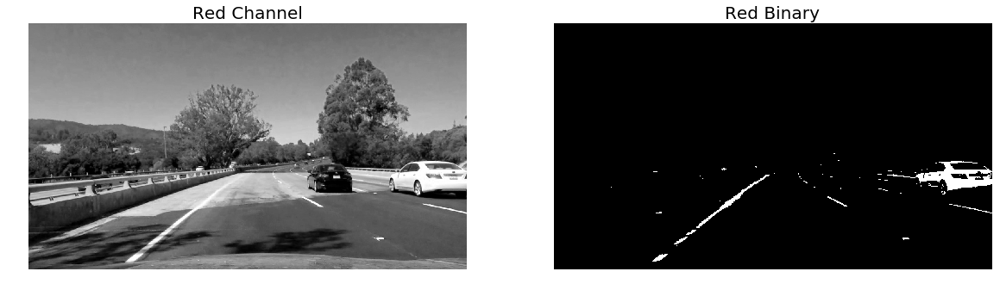

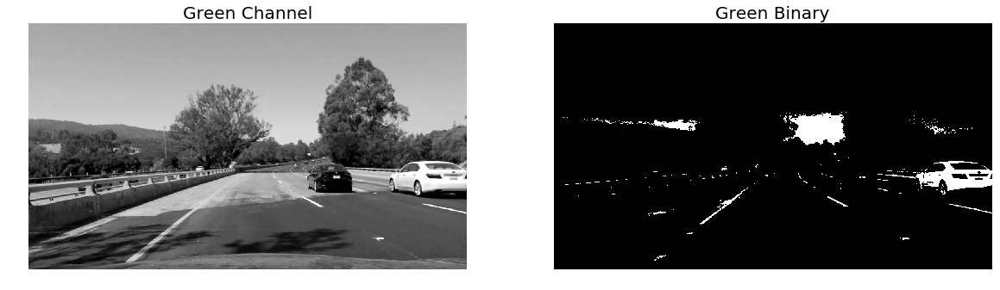

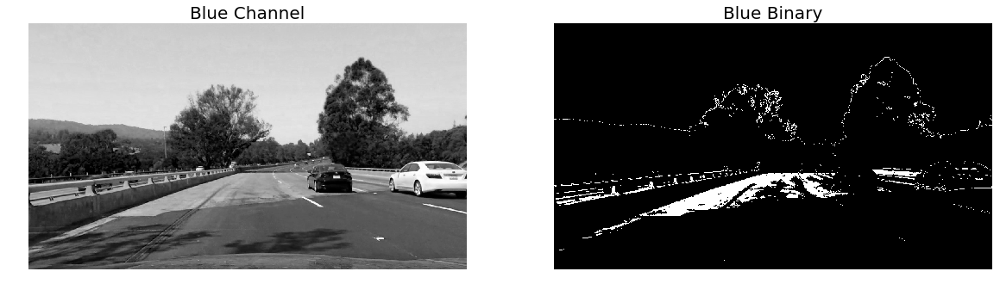

In [305]:
img = test4
B = img[:,:,0]
G = img[:,:,1]
R = img[:,:,2]

thresh = (195, 255)
# Create binaries
r_binary = rgb_thresh(img, channel='R', thresh=(225,255))
g_binary = rgb_thresh(img, channel='G', thresh=(205,255))
b_binary = rgb_thresh(img, channel='B', thresh=(160,187))

# Visualize results
show_RGB(R, r_binary, chan1='gray', chan2='gray', title1='Red Channel', title2='Red Binary')
show_RGB(G, g_binary, chan1='gray', chan2='gray', title1='Green Channel', title2='Green Binary')
show_RGB(B, b_binary, chan1='gray', chan2='gray', title1='Blue Channel', title2='Blue Binary')

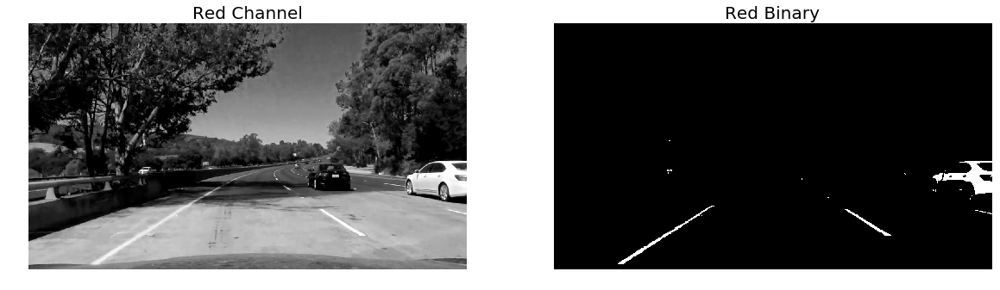

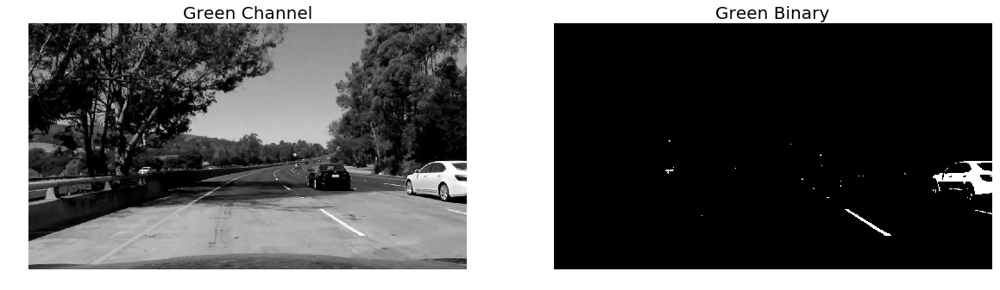

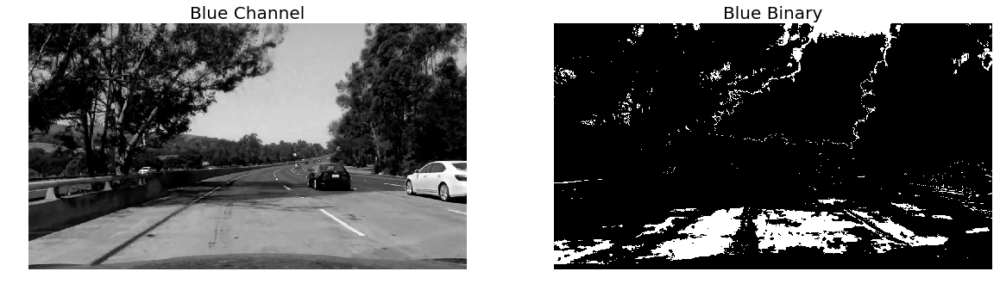

In [306]:
img = test5
B = img[:,:,0]
G = img[:,:,1]
R = img[:,:,2]

# Create binaries
r_binary = rgb_thresh(img, channel='R', thresh=(225,255))
g_binary = rgb_thresh(img, channel='G', thresh=(205,255))
b_binary = rgb_thresh(img, channel='B', thresh=(160,187))

# Visualize results
show_RGB(R, r_binary, chan1='gray', chan2='gray', title1='Red Channel', title2='Red Binary')
show_RGB(G, g_binary, chan1='gray', chan2='gray', title1='Green Channel', title2='Green Binary')
show_RGB(B, b_binary, chan1='gray', chan2='gray', title1='Blue Channel', title2='Blue Binary')

It appears thresholding on the R color space provides a comaparatively clearer lane line compared to G and B color spaces, even during occurance of shadows.

**Thresholding on the HLS color spaces**

In [307]:
def hls_thresh(img, channel='S', thresh=(200, 255)):
    
    # Convert to HLS
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    
    # Split the image into its color channels
    H, L, S = hls[:,:,0], hls[:,:,1], hls[:,:,2]
    
    # Select the channel to use
    if channel == 'H':
        channel = H
    elif channel == 'L':
        channel = L
    elif channel == 'S':
        channel = S
    else:
        raise ValueError("Channel not recognized. Only HLS channels can be displayed as binaries.")
    
    # Create binary mask using the chosen channel
    hls_binary = np.zeros_like(channel)
    hls_binary[(channel > thresh[0]) & (channel <= thresh[1])] = 1
    
    return hls_binary

In [308]:
## Interactive version for tuning threshold parameters (only works while running Jupyter Notebook)

# Select test image
img = test2

@interact
def hls_thresh_image(image: fixed(img), channel:['H','L','S']='S', thresh_min:(0,255)=150, thresh_max:(0,255)=255):
  
    hls_binary = hls_thresh(image, channel, thresh=(thresh_min, thresh_max))
    
    return show_interactive(hls_binary)

interactive(children=(Dropdown(description='channel', index=2, options=('H', 'L', 'S'), value='S'), IntSlider(value=150, description='thresh_min', max=255), IntSlider(value=255, description='thresh_max', max=255), Output()), _dom_classes=('widget-interact',))

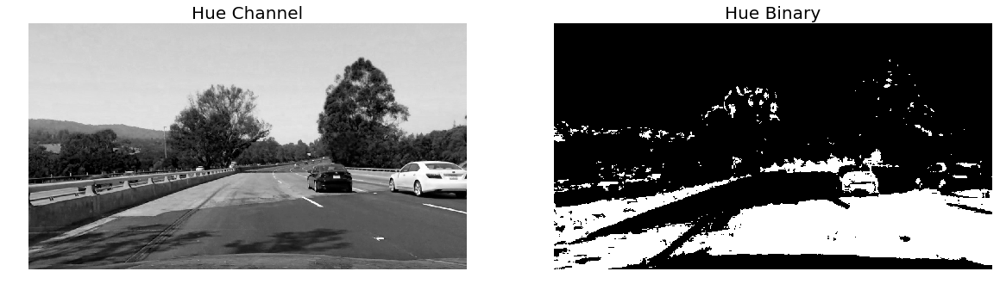

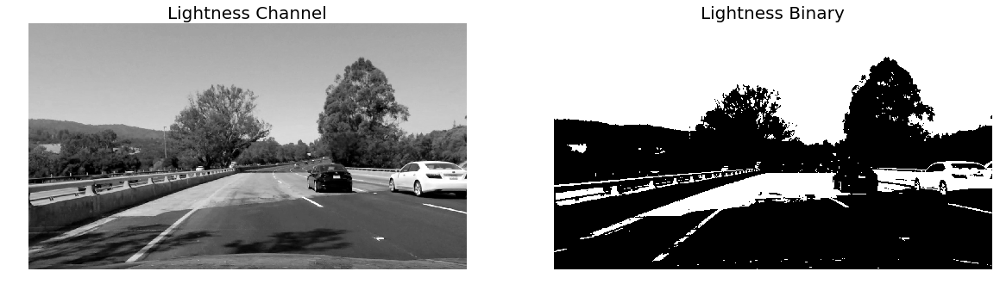

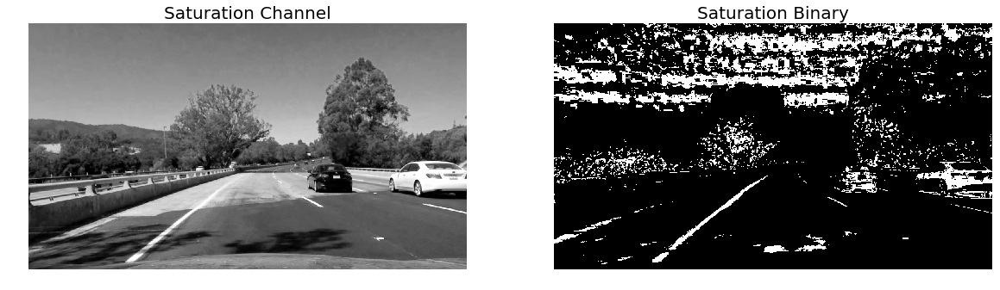

In [309]:
## Show channels and binaries side-by-side

img = test4

# Manually extract HLS channels for display comparison with binaries
H, L, S = img[:,:,0], img[:,:,1], img[:,:,2]

# Create binaries
h_binary = hls_thresh(img, channel='H', thresh=(107,255))
l_binary = hls_thresh(img, channel='L', thresh=(145,255))
s_binary = hls_thresh(img, channel='S', thresh=(120,255))

# Visualize results
show_RGB(H, h_binary, chan1='gray', chan2='gray', title1='Hue Channel', title2='Hue Binary')
show_RGB(L, l_binary, chan1='gray', chan2='gray', title1='Lightness Channel', title2='Lightness Binary')
show_RGB(S, s_binary, chan1='gray', chan2='gray', title1='Saturation Channel', title2='Saturation Binary')

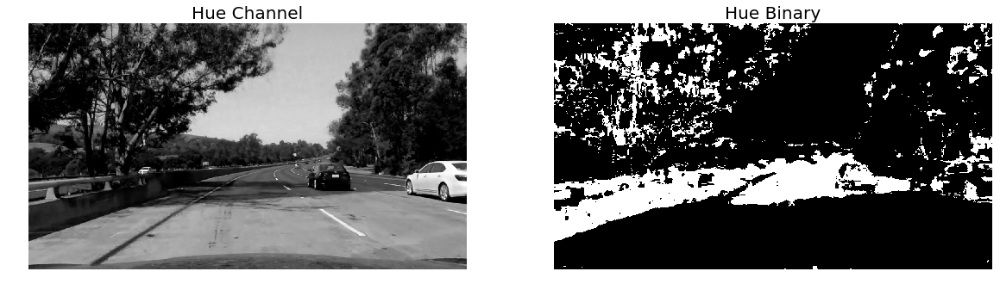

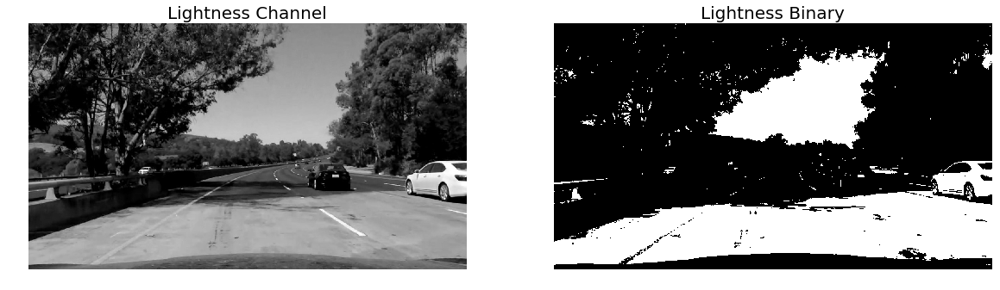

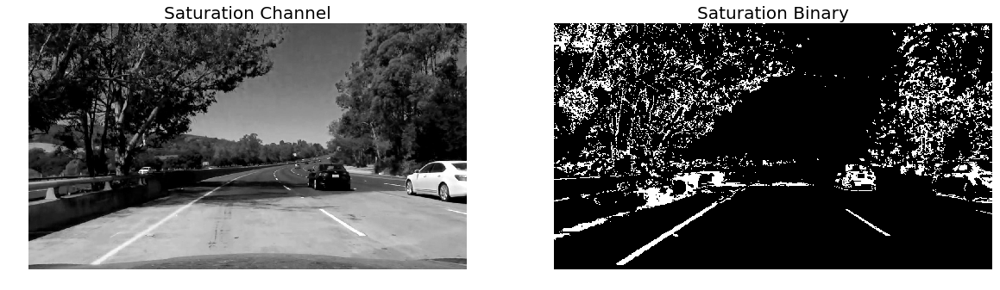

In [310]:
## Show channels and binaries side-by-side

img = test5

# Manually extract HLS channels for display comparison with binaries
H, L, S = img[:,:,0], img[:,:,1], img[:,:,2]

# Create binaries
h_binary = hls_thresh(img, channel='H', thresh=(107,255))
l_binary = hls_thresh(img, channel='L', thresh=(145,255))
s_binary = hls_thresh(img, channel='S', thresh=(120,255))

# Visualize results
show_RGB(H, h_binary, chan1='gray', chan2='gray', title1='Hue Channel', title2='Hue Binary')
show_RGB(L, l_binary, chan1='gray', chan2='gray', title1='Lightness Channel', title2='Lightness Binary')
show_RGB(S, s_binary, chan1='gray', chan2='gray', title1='Saturation Channel', title2='Saturation Binary')

**HSV Color Channels**

In [311]:
def hsv_thresh(img, channel='S', thresh=(200, 255)):
    
    # Convert to HSV
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    
    # Split the image into its color channels
    H, S, V = hsv[:,:,0], hsv[:,:,1], hsv[:,:,2]
    
    # Select the channel to use
    if channel == 'H':
        channel = H
    elif channel == 'S':
        channel = S
    elif channel == 'V':
        channel = V
    else:
        raise ValueError("Channel not recognized. Only HSV channels can be displayed as binaries.")
    
    # Create binary mask using the chosen channel
    hsv_binary = np.zeros_like(channel)
    hsv_binary[(channel > thresh[0]) & (channel <= thresh[1])] = 1
    
    return hsv_binary

In [312]:
img = test4

@interact
def hsv_thresh_image(image: fixed(img), channel:['H','S','V']='V', thresh_min:(0,255)=196, thresh_max:(0,255)=255):
  
    hsv_binary = hsv_thresh(image, channel, thresh=(thresh_min, thresh_max))
    
    return show_interactive(hsv_binary)

interactive(children=(Dropdown(description='channel', index=2, options=('H', 'S', 'V'), value='V'), IntSlider(value=196, description='thresh_min', max=255), IntSlider(value=255, description='thresh_max', max=255), Output()), _dom_classes=('widget-interact',))

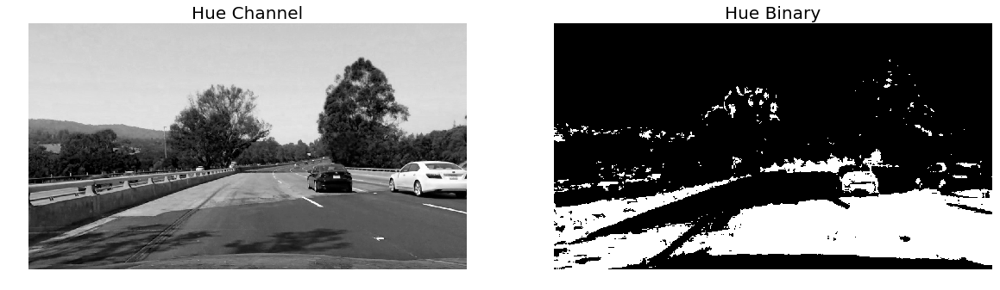

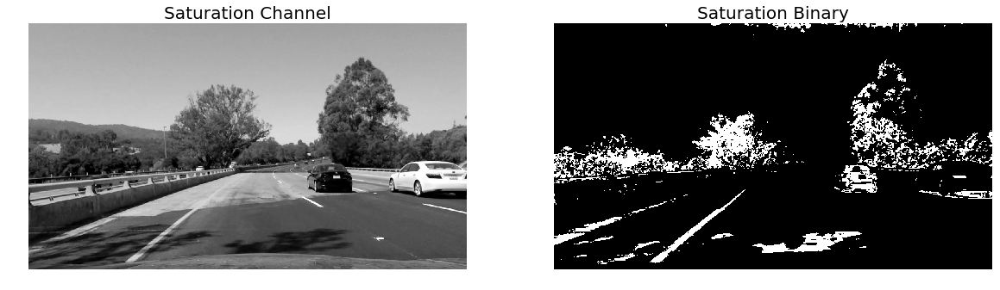

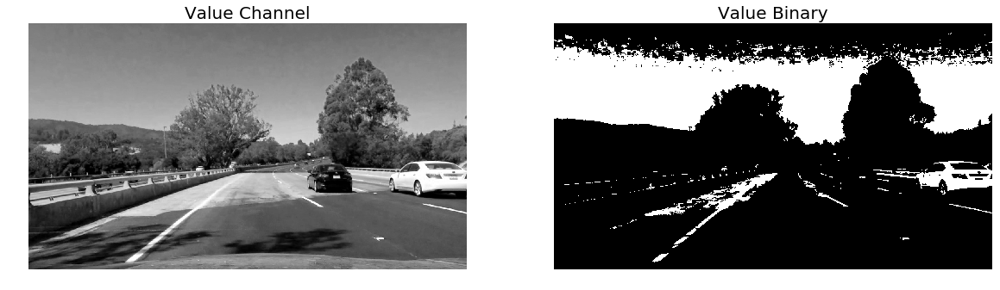

In [313]:
img = test4

# Manually extract HSV channels for display comparison with binaries
H, S, V = img[:,:,0], img[:,:,1], img[:,:,2]

# Create binaries
h_binary = hsv_thresh(img, channel='H', thresh=(107,255))
s_binary = hsv_thresh(img, channel='S', thresh=(120,255))
v_binary = hsv_thresh(img, channel='V', thresh=(209,255))

# Visualize results
show_RGB(H, h_binary, chan1='gray', chan2='gray', title1='Hue Channel', title2='Hue Binary')
show_RGB(S, s_binary, chan1='gray', chan2='gray', title1='Saturation Channel', title2='Saturation Binary')
show_RGB(V, v_binary, chan1='gray', chan2='gray', title1='Value Channel', title2='Value Binary')

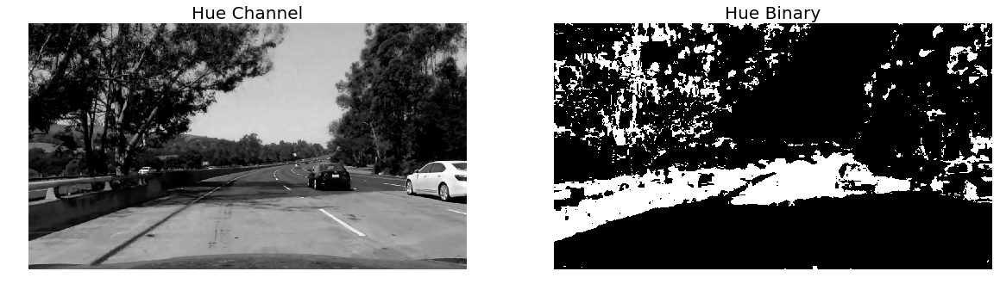

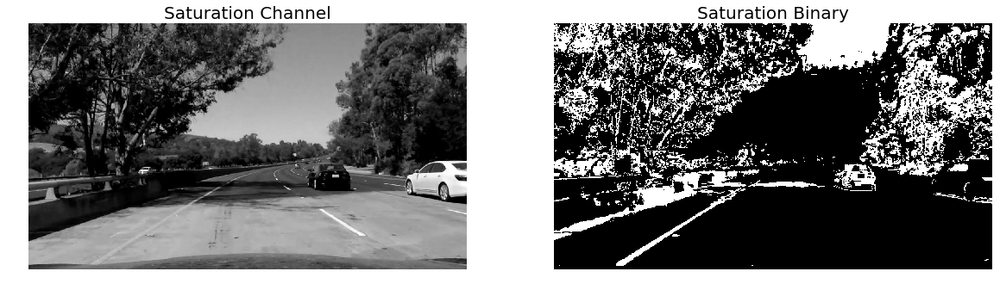

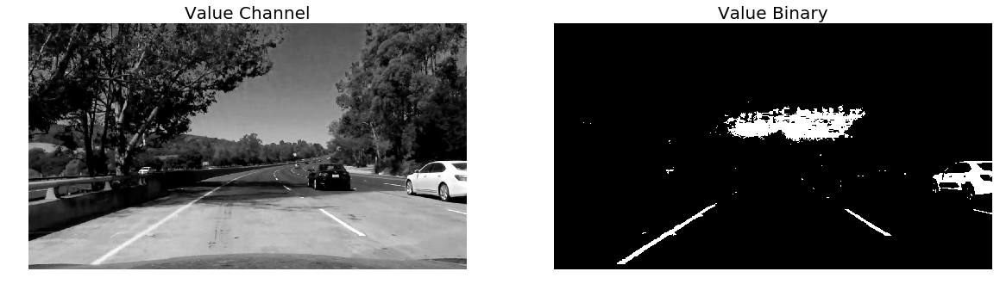

In [314]:
img = test5

# Manually extract HSV channels for display comparison with binaries
H, S, V = img[:,:,0], img[:,:,1], img[:,:,2]

# Create binaries
h_binary = hsv_thresh(img, channel='H', thresh=(107,255))
s_binary = hsv_thresh(img, channel='S', thresh=(120,255))
v_binary = hsv_thresh(img, channel='V', thresh=(209,255))

# Visualize results
show_RGB(H, h_binary, chan1='gray', chan2='gray', title1='Hue Channel', title2='Hue Binary')
show_RGB(S, s_binary, chan1='gray', chan2='gray', title1='Saturation Channel', title2='Saturation Binary')
show_RGB(V, v_binary, chan1='gray', chan2='gray', title1='Value Channel', title2='Value Binary')

**Testing combinations of different thresholds**
* We shall now try to incorporate best and most complimentary methods into one robust approach for identifying lane lines

* **Stacking Test**:
This test shows how different thresholds look when stacked into the same image. This helps to identify which methods are most effective and complimentary.

In [315]:
def stack_thresh(img):
    '''Experiment to see how different thresholds compliment one another when stacked together
    in the same image.'''
    
    # Gradient thresholds
    sx_binary = abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(30,130))
    sy_binary = abs_sobel_thresh(img, orient='y', sobel_kernel=3, thresh=(50,140))
    mag_binary = mag_thresh(img, sobel_kernel=5, mag_thresh=(50,150))
    
    # Color thresholds
    s_binary = hls_thresh(img, channel='S', thresh=(120,255))  # saturation channel
    v_binary = hsv_thresh(img, channel='V', thresh=(225,255))  # value channel 
    
    # Different stack combinations
    sxy_stack = np.dstack((np.zeros_like(s_binary), sx_binary*255, sy_binary*255))
    sxs_stack = np.dstack((np.zeros_like(s_binary), sx_binary*255, s_binary*255))
    sv_stack = np.dstack((np.zeros_like(s_binary), s_binary*255, v_binary*255))
    
    return sxy_stack, sxs_stack, sv_stack

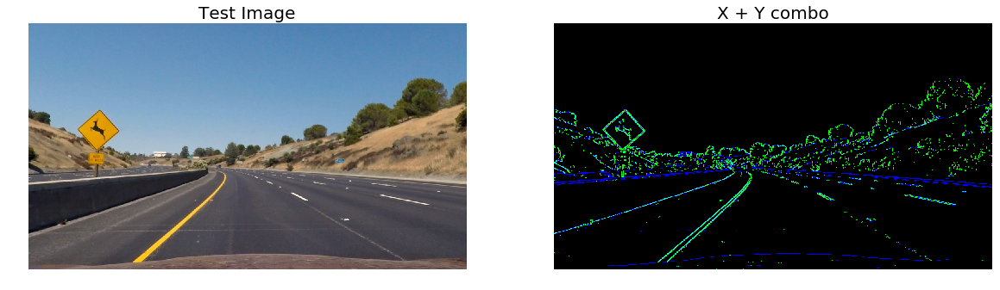

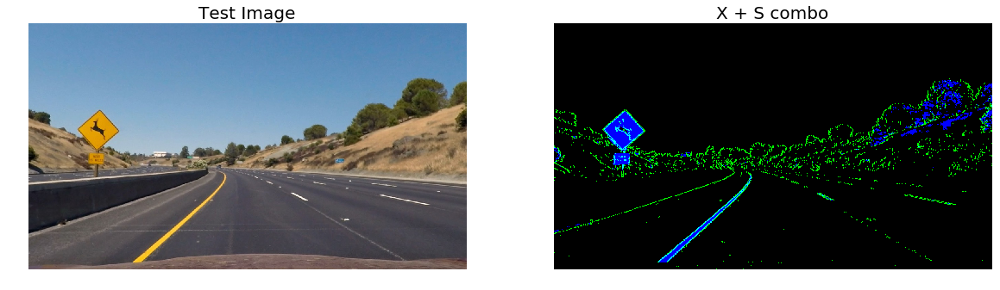

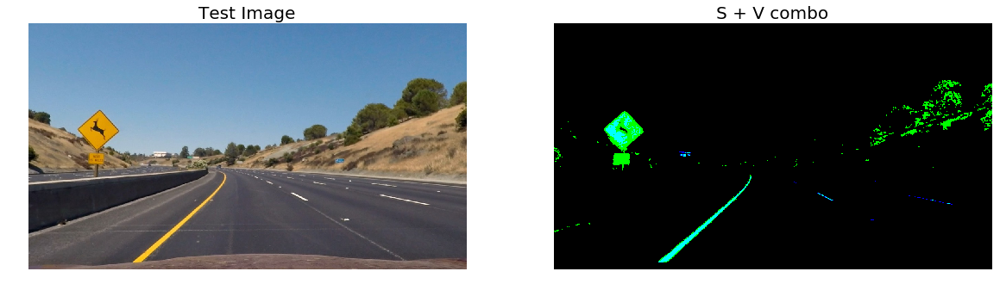

In [316]:
## Show thresholds stacked together in green and blue channels

img = test2

# Create binaries
sxy_stack, sxs_stack, sv_stack = stack_thresh(img)

# Visualize results
show_RGB(img, sxy_stack, chan1='BGR', chan2='gray', title1='Test Image', title2='X + Y combo')
show_RGB(img, sxs_stack, chan1='BGR', chan2='gray', title1='Test Image', title2='X + S combo')
show_RGB(img, sv_stack, chan1='BGR', chan2='gray', title1='Test Image', title2='S + V combo')

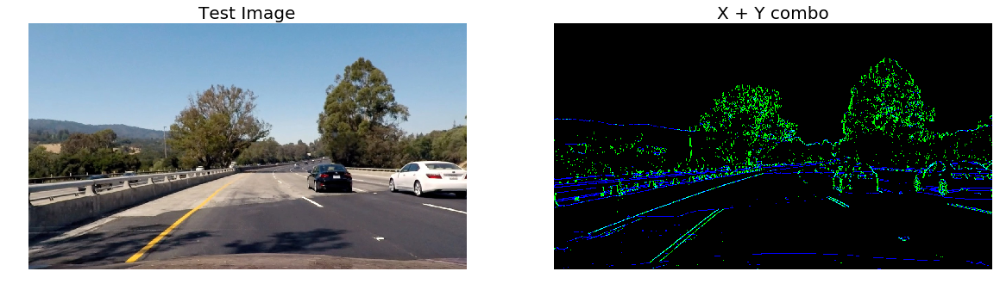

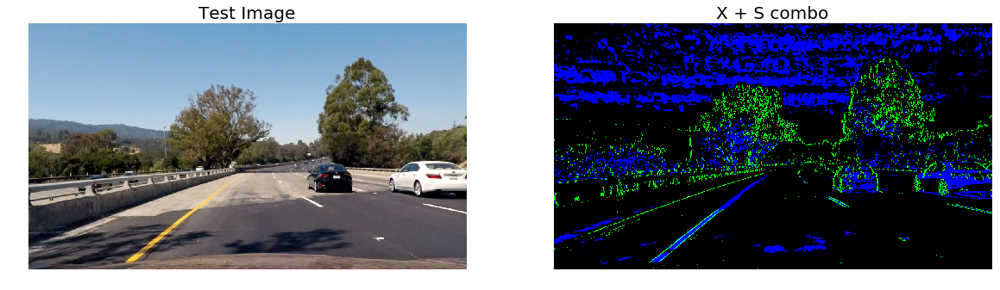

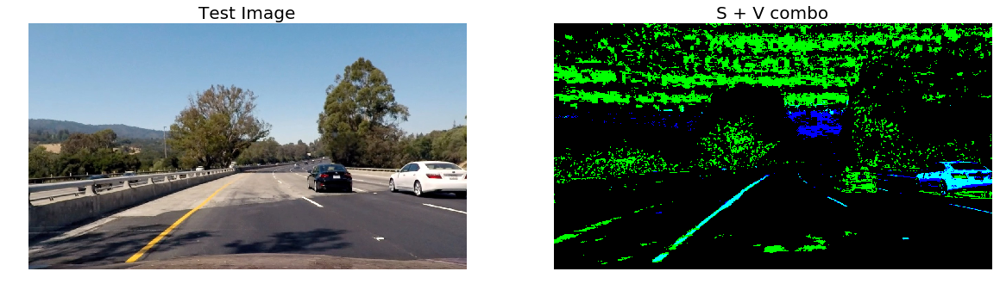

In [317]:
## Show thresholds stacked together in green and blue channels

img = test4

# Create binaries
sxy_stack, sxs_stack, sv_stack = stack_thresh(img)

# Visualize results
show_RGB(img, sxy_stack, chan1='BGR', chan2='gray', title1='Test Image', title2='X + Y combo')
show_RGB(img, sxs_stack, chan1='BGR', chan2='gray', title1='Test Image', title2='X + S combo')
show_RGB(img, sv_stack, chan1='BGR', chan2='gray', title1='Test Image', title2='S + V combo')

**Thresholds Combination Test**
* This tests combines different thresholds into a method for identifying lane lines (represented by a single binary image).

In [318]:
# Combined thresholding function

def comb_thresh(img):
        
    # Gradient thresholds
    sx_binary = abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(30,130))
    sy_binary = abs_sobel_thresh(img, orient='y', sobel_kernel=3, thresh=(50,140))
    mag_binary = mag_thresh(img, sobel_kernel=5, mag_thresh=(50,150))
    
    # Color thresholds
    s_binary = hls_thresh(img, channel='S', thresh=(120,255))  # saturation channel
    v_binary = hsv_thresh(img, channel='V', thresh=(225,255))  # value channel

    ## Combinations of above thresholds:
    
    # Gradients
    grad = np.zeros_like(sx_binary)
    grad[((sx_binary == 1) | (sy_binary == 1)) | (mag_binary == 1)] = 1
    
    # S + V channels
    sv = ((s_binary == 1) | (v_binary == 1))

    # Gradient + SV
    gradsv = ((grad == 1) | (sv == 1))

    # Return various combinations to test
    return sv, gradsv

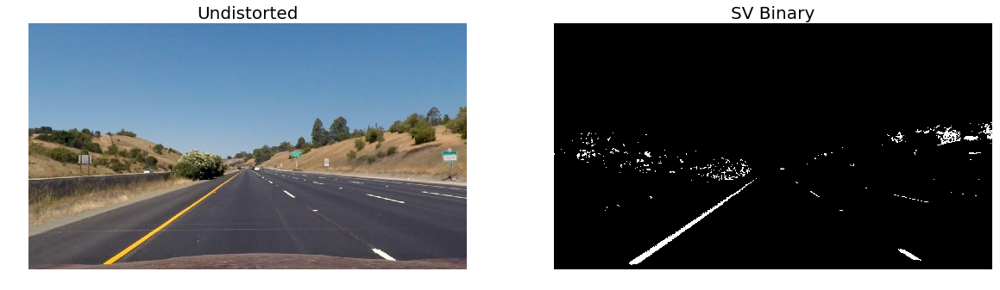

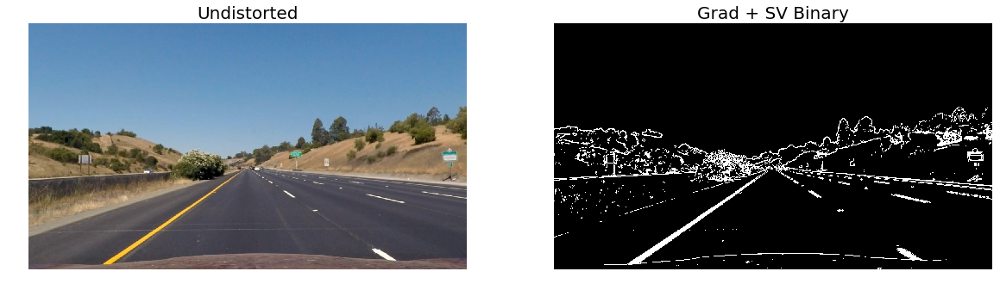

In [319]:
img = straight1

sv, gradsv = comb_thresh(img)
 
show_RGB(img, sv, title2='SV Binary') 
show_RGB(img, gradsv, title2='Grad + SV Binary')

**CONCLUSION:**

It seems the the combination of the saturation (S) and value (V) channels does the cleanest job of identifying lane lines across different driving conditions. The gradient combo (X, Y, and magnitude) captures a lot of other noise in the image besides the lane lines, and doesn't perform well under bad lighting conditions. However, there are instances when the SV+Gradient combonation produces the best results.

For example, in the two images immediately above, the addition of the Gradient combo picks up distant lane lines beyond the shadow that the SV combo misses.

## **4. Perspective Transform**

**Region of Interest and Perspective Transform Matrix**

Here we define the region of the image we want to focus on when trying to detect the lane lines.

In [320]:
# Perspective transform functions

def get_vertices(img):

    # Get image dimensions
    img_size = (img.shape[1], img.shape[0])
    img_width, img_height = img.shape[1], img.shape[0]
    
    # Define the region of interest
    y_mid = img_size[0]/2   # midpoint of image width y
    x_mid = img_size[1]/2   # midpoint of image height x
    y_up_off = 80           # y offset from horizontal midpoint for calculating upper vertices of ROI polynomial
    y_low_off = 450         # y offset from horizontal midpoint for calculating lower vertices of ROI polynomial
    x_up_off = 110          # x offset from vertical midpoint for calculating upper vertices of ROI polynomial
    x_low_off = 350         # x offset from vertical midpoint for calculating lower vertices of ROI polynomial
    
    points = [
        (y_mid - y_up_off, x_mid + x_up_off),   
        (y_mid + y_up_off, x_mid + x_up_off),
        (y_mid + y_low_off, x_mid + x_low_off),
        (y_mid - y_low_off, x_mid + x_low_off),
    ]
    src = np.float32(points)
    
    # Define warp points as dst 
    dst = np.float32([
        [y_mid - y_low_off, 0],
        [y_mid + y_low_off, 0],
        [y_mid + y_low_off, img_height],
        [y_mid - y_low_off, img_height],
    ])
    
    return src, dst


def perspective_transform(img, src, dst):

    # Calculate perspective transforms
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # Apply perspective transformation to image
    img_size = (img.shape[1], img.shape[0])       
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped, M, Minv


def draw_lines(img, vertices):
    points= np.int32([vertices])
    img_lines = cv2.polylines(img, points, True, (0,255,0), thickness=2)
    
    return img_lines

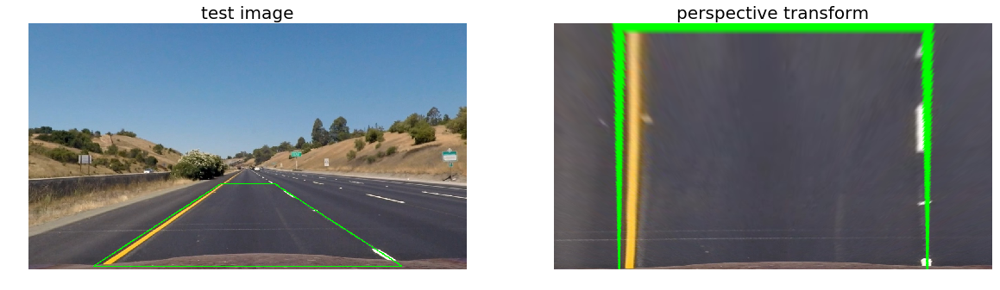

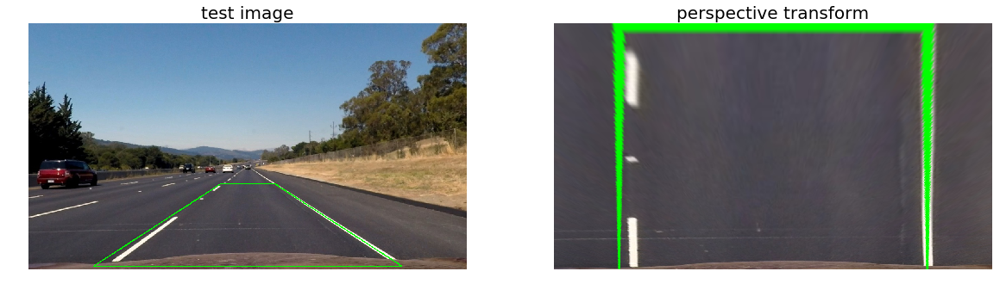

In [321]:
warp_test = np.copy(straight1)

src, dst = get_vertices(warp_test)

warp_test_a = draw_lines(warp_test, src)
warp_test_b = draw_lines(np.copy(straight2), src)

straight1_warp, straight1_M, straight1_Minv = perspective_transform(warp_test_a, src, dst)
straight2_warp, straight2_M, straight2_Minv = perspective_transform(warp_test_b, src, dst)

show_RGB(warp_test_a, straight1_warp, chan2='BGR', title1='test image', title2='perspective transform') 
show_RGB(warp_test_b, straight2_warp, chan2='BGR', title1='test image', title2='perspective transform')

In [322]:
src

array([[  560.,   470.],
       [  720.,   470.],
       [ 1090.,   710.],
       [  190.,   710.]], dtype=float32)

In [323]:
dst

array([[  190.,     0.],
       [ 1090.,     0.],
       [ 1090.,   720.],
       [  190.,   720.]], dtype=float32)

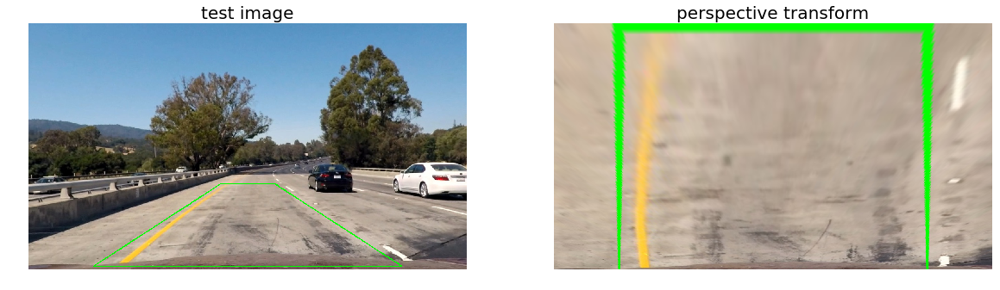

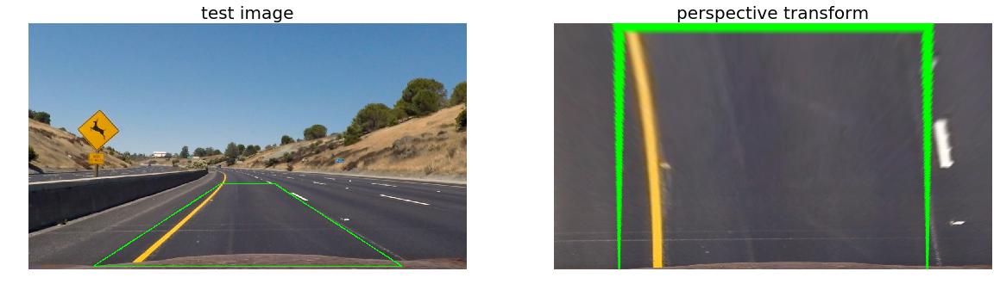

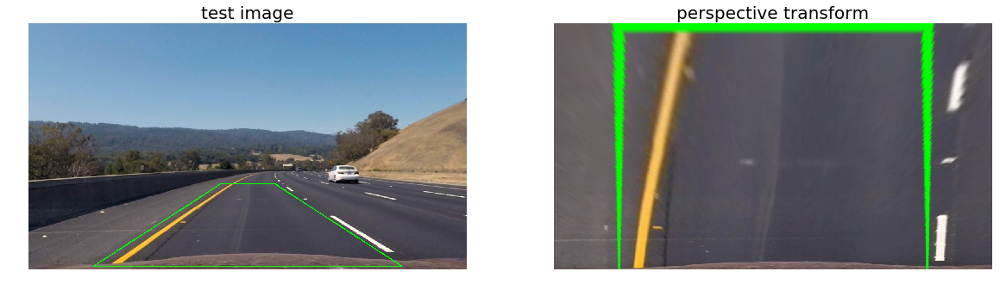

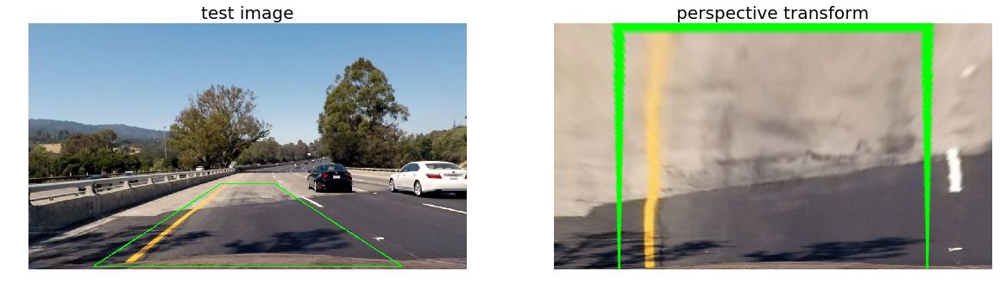

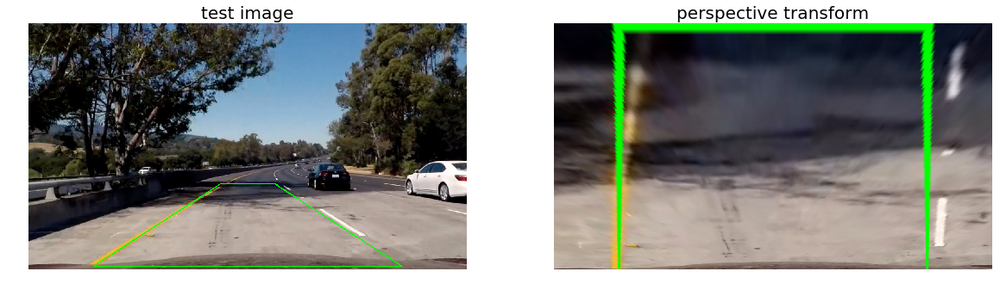

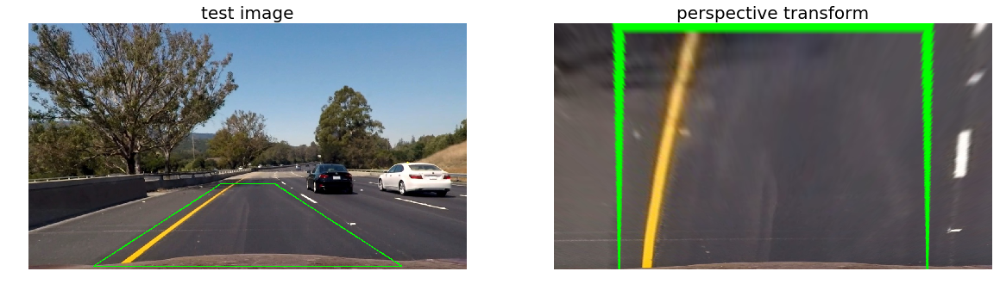

In [324]:
# View perspective transforms for images with curved lane lines

src, dst = get_vertices(test1)

test1_lines = draw_lines(np.copy(test1), src)
test2_lines = draw_lines(np.copy(test2), src)
test3_lines = draw_lines(np.copy(test3), src)
test4_lines = draw_lines(np.copy(test4), src)
test5_lines = draw_lines(np.copy(test5), src)
test6_lines = draw_lines(np.copy(test6), src)

test1_warp, test1_M, test1_Minv = perspective_transform(test1_lines, src, dst)
test2_warp, test2_M, test2_Minv = perspective_transform(test2_lines, src, dst)
test3_warp, test3_M, test3_Minv = perspective_transform(test3_lines, src, dst)
test4_warp, test4_M, test4_Minv = perspective_transform(test4_lines, src, dst)
test5_warp, test5_M, test5_Minv = perspective_transform(test5_lines, src, dst)
test6_warp, test6_M, test6_Minv = perspective_transform(test6_lines, src, dst)

show_RGB(test1_lines, test1_warp, chan2='BGR', title1='test image', title2='perspective transform') 
show_RGB(test2_lines, test2_warp, chan2='BGR', title1='test image', title2='perspective transform') 
show_RGB(test3_lines, test3_warp, chan2='BGR', title1='test image', title2='perspective transform') 
show_RGB(test4_lines, test4_warp, chan2='BGR', title1='test image', title2='perspective transform') 
show_RGB(test5_lines, test5_warp, chan2='BGR', title1='test image', title2='perspective transform') 
show_RGB(test6_lines, test6_warp, chan2='BGR', title1='test image', title2='perspective transform')

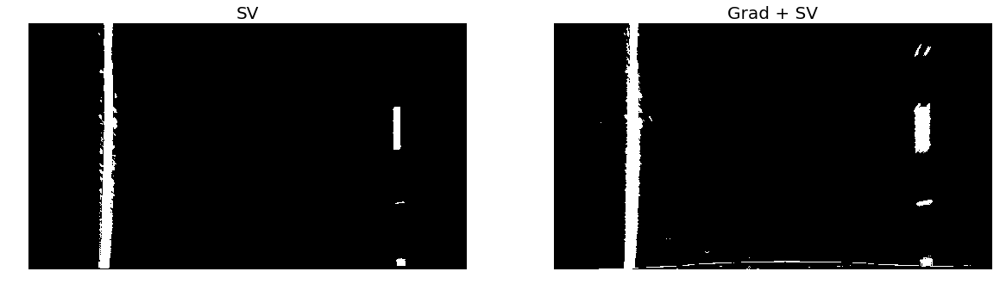

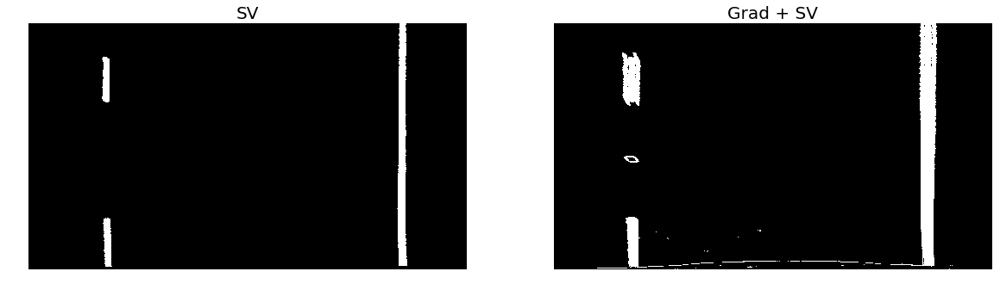

In [325]:
# Preview binary versions of the perspective transforms -- Straight lanes

# Straight1 test image
img_a = straight1
src, dst = get_vertices(img_a)
warped_a, _, _ = perspective_transform(img_a, src, dst)
sv_binary_warp_a, gradsv_binary_warp_a = comb_thresh(warped_a)
show_RGB(sv_binary_warp_a, gradsv_binary_warp_a, chan1='gray', title1='SV', title2='Grad + SV') 

# Straight2 test image
img_b = straight2
src, dst = get_vertices(img_b)
warped_b, _, _ = perspective_transform(img_b, src, dst)
sv_binary_warp_b, gradsv_binary_warp_b = comb_thresh(warped_b)
show_RGB(sv_binary_warp_b, gradsv_binary_warp_b, chan1='gray', title1='SV', title2='Grad + SV')

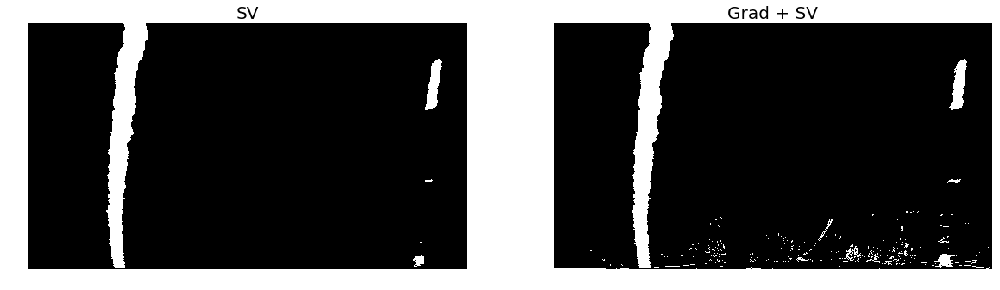

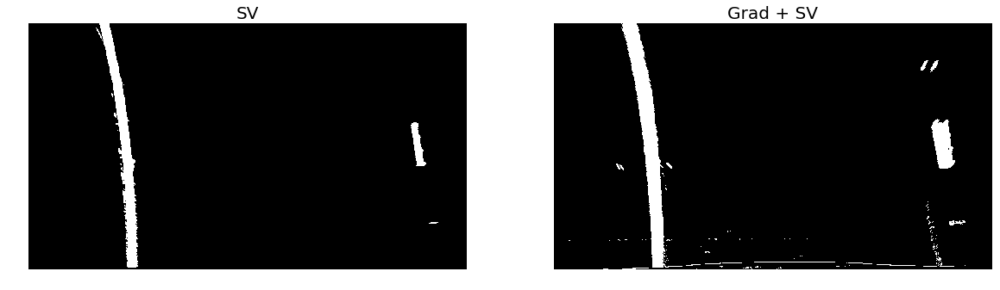

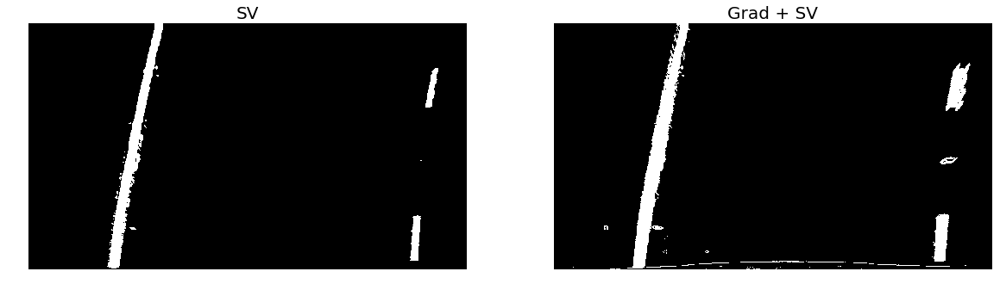

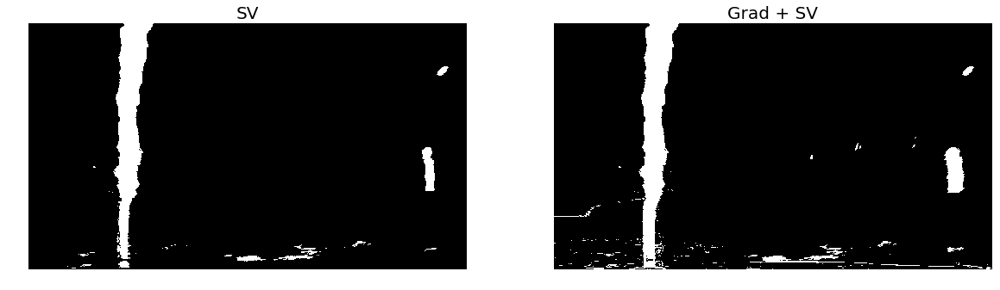

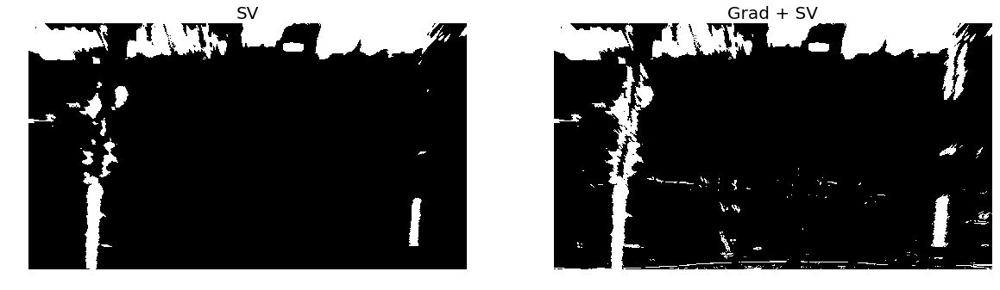

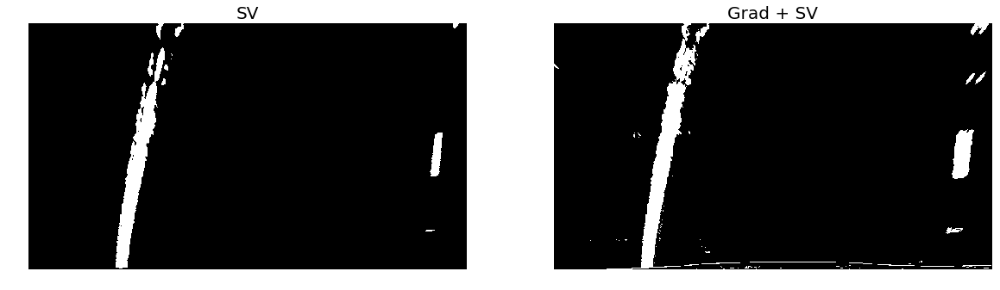

In [326]:
# Preview binary versions of the perspective transforms -- Curved lanes + shadows

img_1, img_2, img_3, img_4, img_5, img_6 = test1, test2, test3, test4, test5, test6

src, dst = get_vertices(img_1)

warped_1, M, Minv = perspective_transform(img_1, src, dst)
warped_2, M, Minv = perspective_transform(img_2, src, dst)
warped_3, M, Minv = perspective_transform(img_3, src, dst)
warped_4, M, Minv = perspective_transform(img_4, src, dst)
warped_5, M, Minv = perspective_transform(img_5, src, dst)
warped_6, M, Minv = perspective_transform(img_6, src, dst)

sv_binary_warp_1, gradsv_binary_warp_1 = comb_thresh(warped_1)
sv_binary_warp_2, gradsv_binary_warp_2 = comb_thresh(warped_2)
sv_binary_warp_3, gradsv_binary_warp_3 = comb_thresh(warped_3)
sv_binary_warp_4, gradsv_binary_warp_4 = comb_thresh(warped_4)
sv_binary_warp_5, gradsv_binary_warp_5 = comb_thresh(warped_5)
sv_binary_warp_6, gradsv_binary_warp_6 = comb_thresh(warped_6)

show_RGB(sv_binary_warp_1, gradsv_binary_warp_1, chan1='gray', title1='SV', title2='Grad + SV') 
show_RGB(sv_binary_warp_2, gradsv_binary_warp_2, chan1='gray', title1='SV', title2='Grad + SV') 
show_RGB(sv_binary_warp_3, gradsv_binary_warp_3, chan1='gray', title1='SV', title2='Grad + SV') 
show_RGB(sv_binary_warp_4, gradsv_binary_warp_4, chan1='gray', title1='SV', title2='Grad + SV') 
show_RGB(sv_binary_warp_5, gradsv_binary_warp_5, chan1='gray', title1='SV', title2='Grad + SV') 
show_RGB(sv_binary_warp_6, gradsv_binary_warp_6, chan1='gray', title1='SV', title2='Grad + SV')

**Conclusion:**

You can see that there's a trade-off between the two threshold methods. The SV threshold produces cleaner lines but doesn't all of the lines. Whereas the Grad+SV threshold produces binaries with more noise, but captures more of the line fragments.

## **5. Detect Lane Pixels and Fit to the Lane Boundary

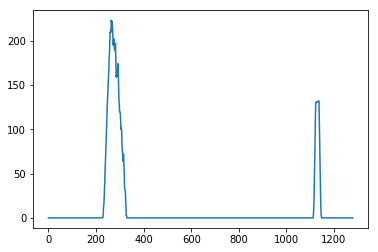

In [327]:
# Preview lane detection histogram

binary_warped = sv_binary_warp_3

histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
plt.plot(histogram)

In [328]:
# Use warped binary to identify lane lines using sliding windows approach

def find_lines(binary_warped, show=False):

    # Make sure binary doesn't have float values
    binary_warped = binary_warped.astype('uint8')
    
    if show:
        # Create an output image to draw on and  visualize the result
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Set the width of the windows +/- margin
    margin = 100
    
    # Set minimum number of pixels found to recenter window
    minpix = 50
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        if show:
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2)         
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
        
    if show:
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        fig2 = plt.figure(figsize = (10,10)) # create a 5 x 5 figure 
        ax3 = fig2.add_subplot(1, 1, 1)
        ax3.imshow(out_img, interpolation='none')
        ax3.plot(left_fitx, ploty, color='yellow')
        ax3.plot(right_fitx, ploty, color='yellow')    
        ax3.set_title('Sliding Windows & Polynomial Fit')
        plt.show()  
        
    return left_fit, right_fit

In [329]:
# Function that uses the last frame as reference for fitting the next frame

def use_last_frame(binary_warped, left_fit, right_fit):

    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 30
    left_lane_inds = (
        (nonzerox > (left_fit[0] * (nonzeroy ** 2) + left_fit[1] * nonzeroy + left_fit[2] - margin)) &
        (nonzerox < (left_fit[0] * (nonzeroy ** 2) + left_fit[1] * nonzeroy + left_fit[2] + margin)))
    right_lane_inds = (
        (nonzerox > (right_fit[0] * (nonzeroy ** 2) + right_fit[1] * nonzeroy + right_fit[2] - margin)) &
        (nonzerox < (right_fit[0] * (nonzeroy ** 2) + right_fit[1] * nonzeroy + right_fit[2] + margin)))

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0] - 1, binary_warped.shape[0])
    left_fitx = left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2]
    
        
    return left_fitx, right_fitx, ploty, left_fit, right_fit, leftx, rightx, lefty, righty, left_lane_inds, right_lane_inds

In [330]:
# Function that shows where the lane lines will be drawn -- visualization purposes only

def visualize_lane_lines(binary_warped, left_fitx, right_fitx, ploty, left_lane_inds, right_lane_inds):
    # Make sure binary doesn't have float values
    binary_warped = binary_warped.astype('uint8')
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    fig = plt.figure(figsize = (10,10)) 
    ax1 = fig.add_subplot(1, 1, 1)
    ax1.imshow(result, interpolation='none')
    ax1.plot(left_fitx, ploty, color='yellow')
    ax1.plot(right_fitx, ploty, color='yellow')    
    ax1.set_title('Lane Lines')
    plt.show()

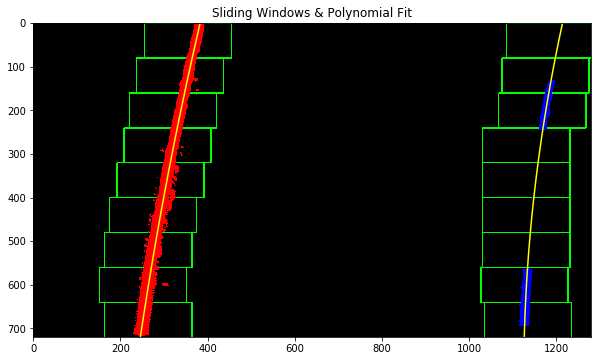

In [331]:
# Preview output of sliding windows and polynomial fit

left_fit, right_fit = find_lines(binary_warped, show=True)

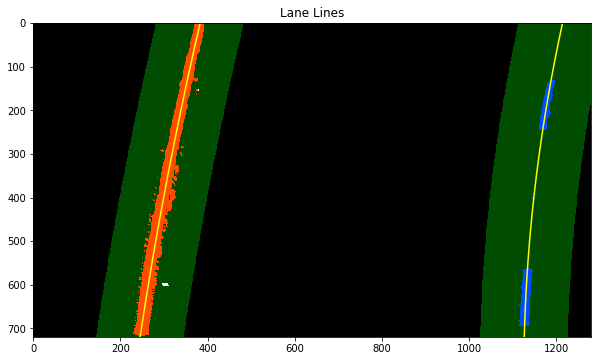

In [332]:
# Preview where the lane lines will be drawn

src, dst = get_vertices(test3)
warped, M, Minv = perspective_transform(test3, src, dst)
binary_warped, gradsv_binary_warp = comb_thresh(warped)
left_fitx, right_fitx, ploty, left_fit, right_fit, leftx, rightx, lefty, righty, left_lane_inds, right_lane_inds = use_last_frame(binary_warped, left_fit, right_fit)
visualize_lane_lines(binary_warped, left_fitx, right_fitx, ploty, left_lane_inds, right_lane_inds)

## **6. Determine Lane Curvature and Vehicle Position**

In [333]:
def radius_center(ploty, leftx, rightx, lefty, righty):
    
    y_eval = np.max(ploty)
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30 / 720  # meters per pixel in y dimension
    xm_per_pix = 3.7 / 700  # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty * ym_per_pix, leftx * xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty * ym_per_pix, rightx * xm_per_pix, 2)

    # Calculate the new radii of curvature
    left_curve_radius = ((1 + (2 * left_fit_cr[0] * y_eval * ym_per_pix + left_fit_cr[1]) ** 2) ** 1.5) / np.absolute(
        2 * left_fit_cr[0])
    right_curve_radius = ((1 + (2 * right_fit_cr[0] * y_eval * ym_per_pix + right_fit_cr[1]) ** 2) ** 1.5) / np.absolute(
        2 * right_fit_cr[0])
    radius = np.mean([left_curve_radius, right_curve_radius])

    left_y_max = np.argmax(lefty)
    right_y_max = np.argmax(righty)
    center_x = (leftx[left_y_max] + rightx[right_y_max])/2
    center_offset = (640 - center_x) * xm_per_pix
    
    
    return radius, center_offset

## **7. Overlay Lane Boundaries onto the image**

In [334]:
# Function for drawing complete lane markings back onto the original image

def project_back(binary_warped, original_image, undist, Minv, left_fitx, right_fitx, ploty):
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv,
                                  (original_image.shape[1], original_image.shape[0]))
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    return result

**Smoothing**

Here we caculate a moving average of the line plotting variables in order to smooth out the resulting lines that will be drawn back onto the original image.

In [335]:
# Moving average function

def moving_average(radius, center_offset, left, right, plot):

    global count
    if count == 5:
        recent_radius.pop(0)
        recent_center_offset.pop(0)
        recent_left_fitx.pop(0)
        recent_right_fitx.pop(0)
        recent_ploty.pop(0)
    else:
        count += 1
    recent_radius.append(radius)
    recent_center_offset.append(center_offset)
    recent_left_fitx.append(left)
    recent_right_fitx.append(right)
    recent_ploty.append(plot)
    if count > 5:
        exit()

In [336]:
# Set global variables for moving average

count = 0
first = True
left_fitx = None
right_fitx = None
ploty = None
left_fit = None
right_fit = None
leftx = None
rightx = None
lefty = None
righty = None

# Create placeholder lists for storing recent values
recent_radius = []
recent_center_offset = []
recent_left_fitx = []
recent_right_fitx = []
recent_ploty = []

**Final Pipeline**

In [337]:


def pipeline(image):
    undist = undistort(image)
    src, dst = get_vertices(undist)
    warped, M, Minv = perspective_transform(undist, src, dst)
    warped_binary_sv, warped_binary = comb_thresh(warped)
    
    global first, left_fitx, right_fitx, ploty, left_fit, right_fit, leftx, rightx, lefty, righty
    
    if first:
        left_fit, right_fit = find_lines(warped_binary)
        left_fitx, right_fitx, ploty, left_fit, right_fit, leftx, rightx, lefty, righty, _, _ = \
            use_last_frame(warped_binary, left_fit, right_fit)
        first = False

    left_fitx, right_fitx, ploty, left_fit, right_fit, leftx, rightx, lefty, righty, _, _ = \
        use_last_frame(warped_binary, left_fit, right_fit)
    
    radius, center_offset = radius_center(ploty, leftx, rightx, lefty, righty)

    moving_average(radius, center_offset, left_fitx, right_fitx, ploty)

    result = project_back(warped_binary, image, undist, Minv,
                          np.add.reduce(recent_left_fitx) / count,
                          np.add.reduce(recent_right_fitx) / count,
                          np.add.reduce(recent_ploty) / count)

    cv2.putText(result, 'Radius: {0:.1f}m '.format(np.add.reduce(recent_radius) / count), (50, 50), 
                cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, bottomLeftOrigin=False)
    cv2.putText(result, 'Center Offset: {0:.2f}m'.format(np.add.reduce(recent_center_offset) / count), (50, 100),
                cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, bottomLeftOrigin=False)
    
    
    return result



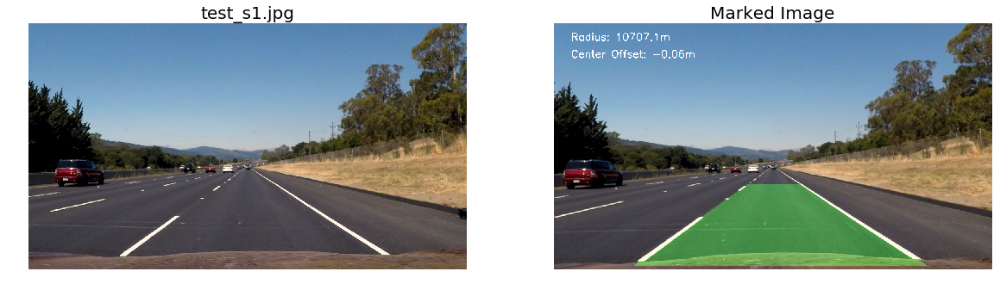

In [338]:
image_s1 = cv2.imread('test_images/straight_lines2.jpg')
test_s1_marked = pipeline(image_s1)
show_RGB(image_s1, test_s1_marked, chan1='BGR', chan2='BGR', title1='test_s1.jpg', title2='Marked Image')

## **8. Video Output**

Here we need create a visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position with respect to center.

In [339]:
def video_pipeline(video_file, output_file, process_method):
    """
    :param     video_file: source video file path
    :param    output_file: output video file path
    :param process_method: the callback function which is used to process the video per frame
    :return:
    """
    clip = VideoFileClip(video_file)
    processed_clip = clip.fl_image(process_method)  # NOTE: this function expects color images!!
    processed_clip.write_videofile(output_file, audio=False);

In [341]:
video_pipeline("challenge_video.mp4", "challenge_video_out.mp4", pipeline);

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


100%|█████████▉| 1260/1261 [05:02<00:00,  4.22it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 

